In [1]:
# importing the visualization and the manuplating packages to do analysis 

import pandas as pd # for malipulating and analysis
import numpy as np # for scintifinc computing

# visuaization packeges

import seaborn as sns # create the visualization 
import matplotlib.pyplot as plt # it is used for the customizing


# Data Set Details:



step 1: read the temperature_data set which have the folowing columns and there detailes

Details of the data: 

Comprehensive csv files containing all measurement sessions and features. Each row represents one snapshot of sensor data at a certain time step. Sample rate is 2 Hz (One row per 0.5 seconds). Distinctive sessions are identified with "profile_id".


Feature set:

ambient
Ambient temperature as measured by a thermal sensor located closely to the stator.

coolant
Coolant temperature. The motor is water cooled. Measurement is taken at the outflow.

u_d
Voltage d-component

u_q
Voltage q-component

motor_speed
Motor speed

torque
Torque induced by current.

i_d
Current d-component

i_q
Current q-component

pm
Permanent Magnet surface temperature representing the rotor temperature. This was measured with an infrared thermography unit.

stator_yoke
Stator yoke temperature is measured with a thermal sensor.

stator_tooth
Stator tooth temperature is measured with a thermal sensor.

stator_winding
Stator winding temperature measured with a thermal sensor.

profile_id
Each measurement session has a unique ID. Make sure not to try to estimate from one session onto the other as they are strongly independent.






# Loding the dataset


In [2]:
data = pd.read_csv('temperature_data.csv')
data.head(2)

# loding the data with top two rows

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4


# # Step 2

# Explore the data:




In [3]:
#Print the first few rows of the dataset to get a glimpse of the data structure:

print(data.head())

#Check the dimensions of the dataset (number of rows and columns):

print(data.shape)

    ambient   coolant       u_d       u_q  motor_speed    torque       i_d  \
0 -0.752143 -1.118446  0.327935 -1.297858    -1.222428 -0.250182  1.029572   
1 -0.771263 -1.117021  0.329665 -1.297686    -1.222429 -0.249133  1.029509   
2 -0.782892 -1.116681  0.332771 -1.301822    -1.222428 -0.249431  1.029448   
3 -0.780935 -1.116764  0.333700 -1.301852    -1.222430 -0.248636  1.032845   
4 -0.774043 -1.116775  0.335206 -1.303118    -1.222429 -0.248701  1.031807   

        i_q        pm  stator_yoke  stator_tooth  stator_winding  profile_id  
0 -0.245860 -2.522071    -1.831422     -2.066143       -2.018033           4  
1 -0.245832 -2.522418    -1.830969     -2.064859       -2.017631           4  
2 -0.245818 -2.522673    -1.830400     -2.064073       -2.017343           4  
3 -0.246955 -2.521639    -1.830333     -2.063137       -2.017632           4  
4 -0.246610 -2.521900    -1.830498     -2.062795       -2.018145           4  
(998070, 13)


In [5]:
# Based on the code results there are 9.98 Lakes of rows and the 13 columns are there in the data

In [6]:
# Get a summary of the statistical measures of the numerical columns:

data.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


In [9]:
df.isnull().sum() # there are no null valuse in the data

ambient           0
coolant           0
u_d               0
u_q               0
motor_speed       0
torque            0
i_d               0
i_q               0
pm                0
stator_yoke       0
stator_tooth      0
stator_winding    0
profile_id        0
dtype: int64

In [7]:
#Explore the column names and data types:

print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB
None


In [ ]:
# as you can see the data, it have one integer and remaining all are float data types

#Here the number of variables (columns) is 13, and the number of instances (rows) is 998070.


# Visualize the data:


In this below code of single variable visualization, sns.histplot() is used to plot the histogram of each column. The x-label is set to the current column name, and the y-label is set to 'Frequency' to represent the count of data points in each bin of the histogram.

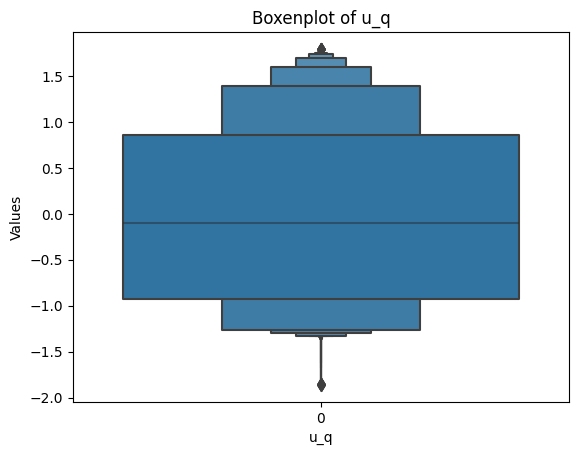

The variable u_q not have outliers.


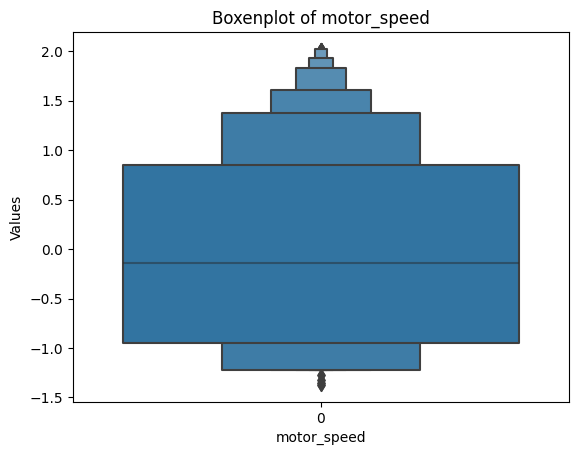

The variable motor_speed not have outliers.


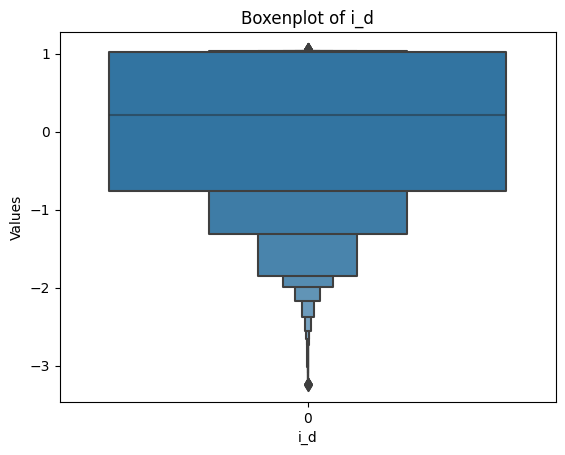

The variable i_d not have outliers.


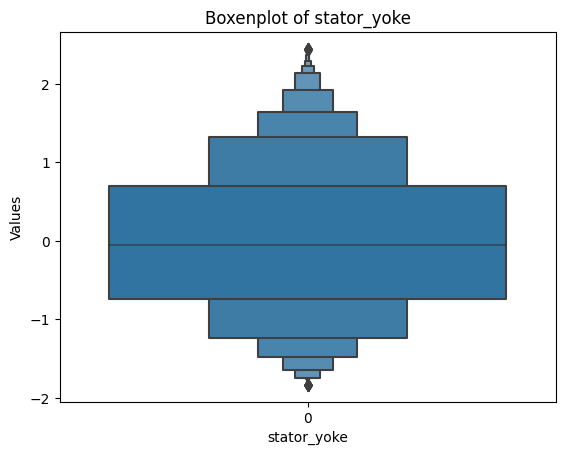

The variable stator_yoke not have outliers.


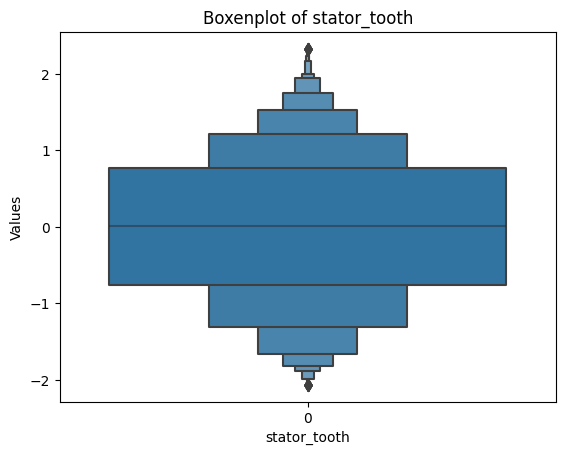

The variable stator_tooth not have outliers.


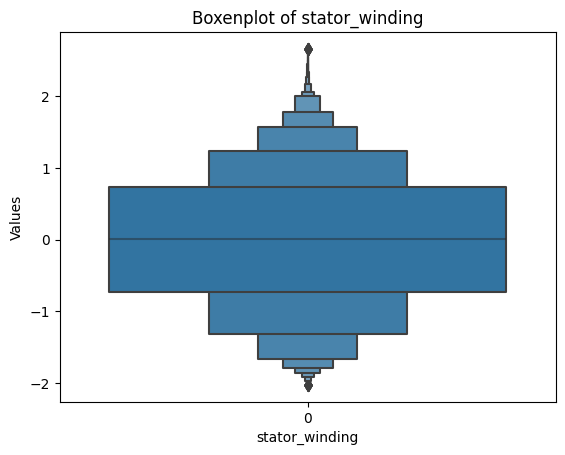

The variable stator_winding not have outliers.


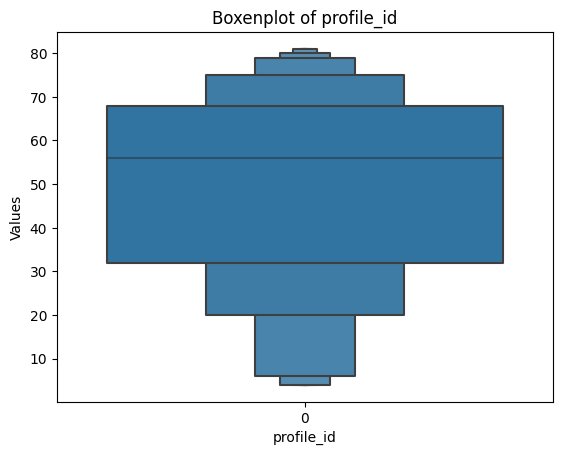

The variable profile_id not have outliers.


In [29]:
# Define the column names and the corresponding columns of interest with outliers
columns_of_interest = ['u_q', 'motor_speed', 'i_d', 'stator_yoke', 'stator_tooth', 'stator_winding', 'profile_id']

# Iterate over each column name for box plot visualization
for column_name in columns_of_interest:
    # Ploting the boxenplot
    sns.boxenplot(data=data[column_name])
    plt.xlabel(column_name)
    plt.ylabel('Values')
    plt.title(f'Boxenplot of {column_name}')
    plt.show()

    # Mention that the variable has outliers
    print(f"The variable {column_name} not have outliers.")

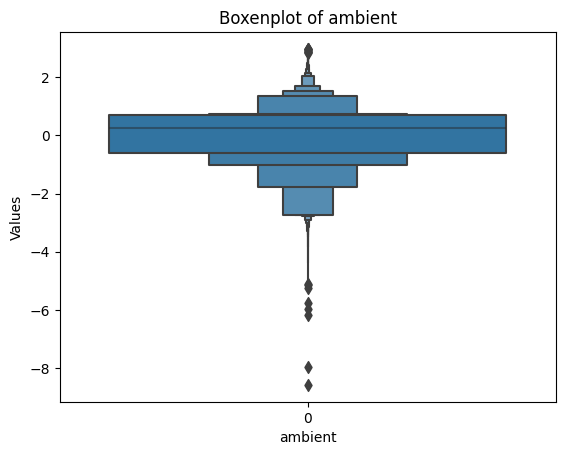

The variable ambient have outliers.


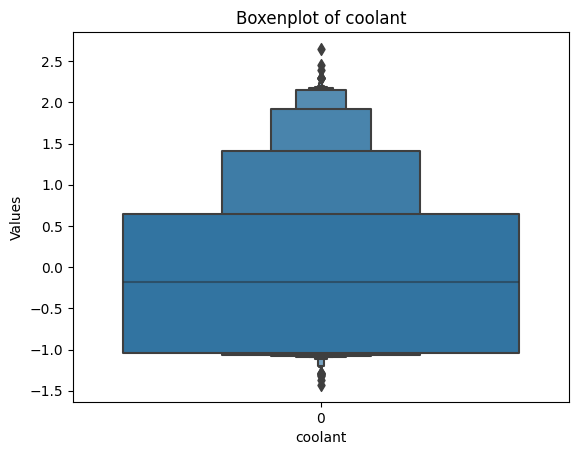

The variable coolant have outliers.


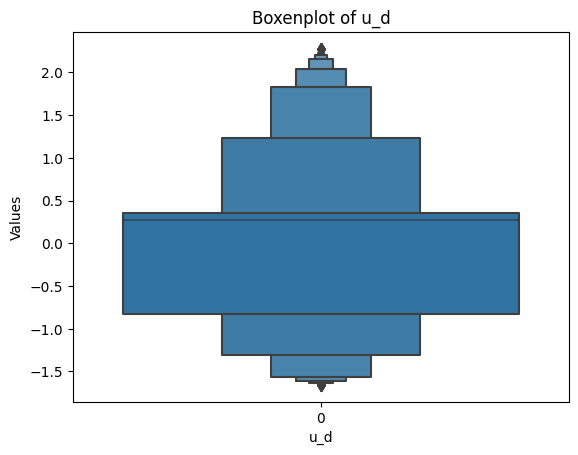

The variable u_d have outliers.


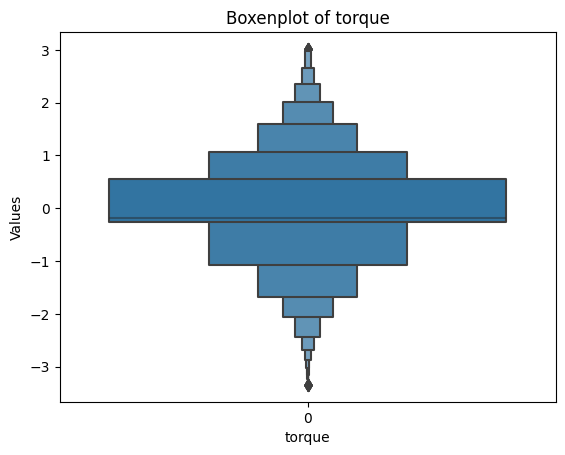

The variable torque have outliers.


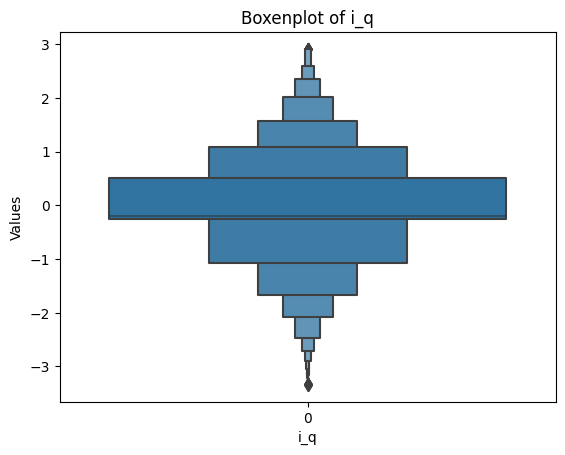

The variable i_q have outliers.


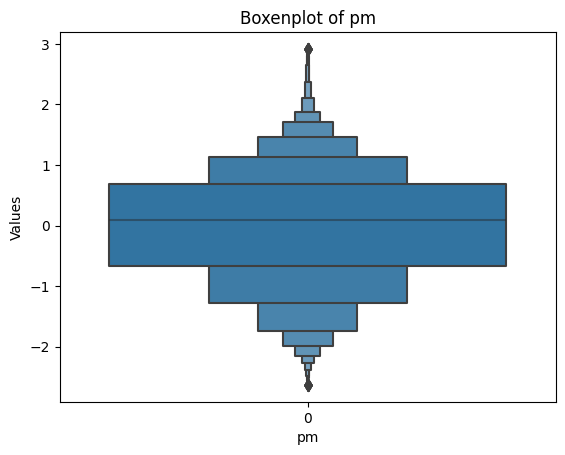

The variable pm have outliers.


In [30]:

# Define the column names and the corresponding columns of interest with outliers
columns_of_interest = ['ambient', 'coolant', 'u_d', 'torque', 'i_q', 'pm']

# Iterate over each column name for box plot visualization
for column_name in columns_of_interest:
    # Ploting the boxenplot
    sns.boxenplot(data=data[column_name])
    plt.xlabel(column_name)
    plt.ylabel('Values')
    plt.title(f'Boxenplot of {column_name}')
    plt.show()

    # Mention that the variable has outliers
    print(f"The variable {column_name} have outliers.")

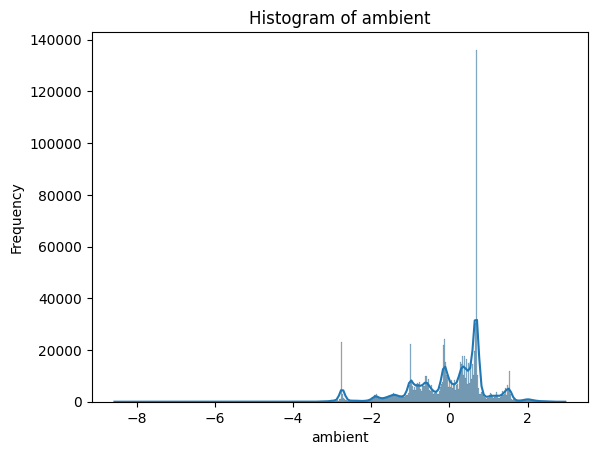

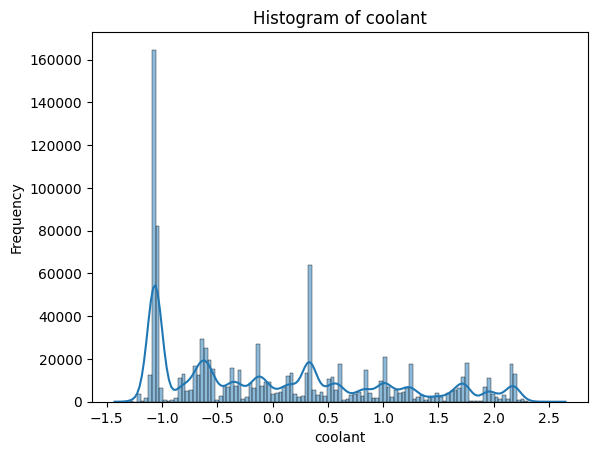

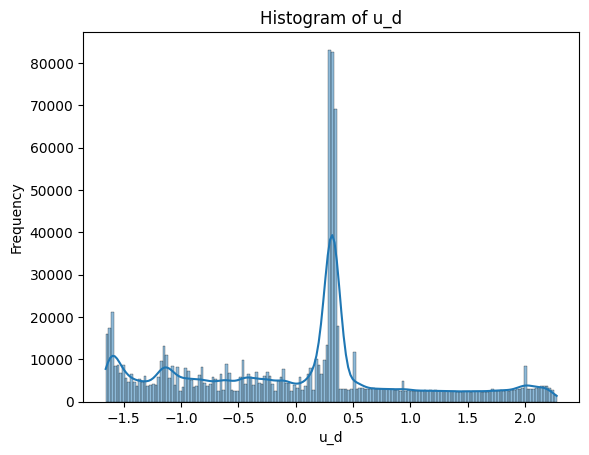

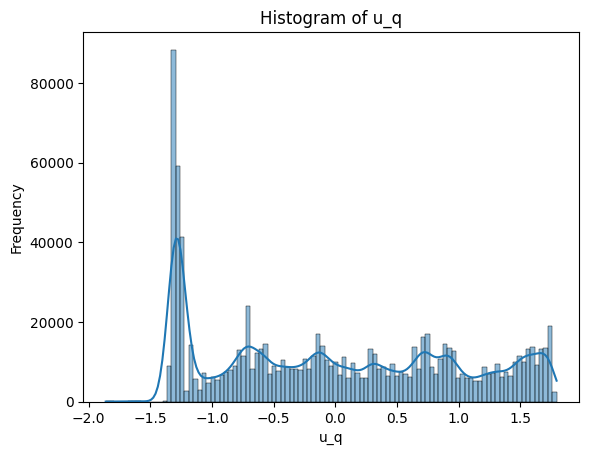

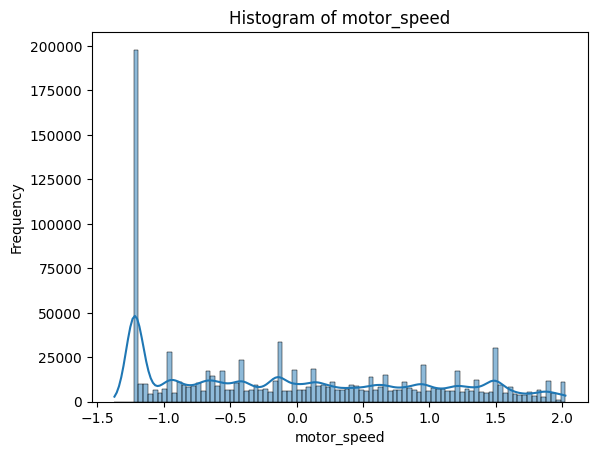

...

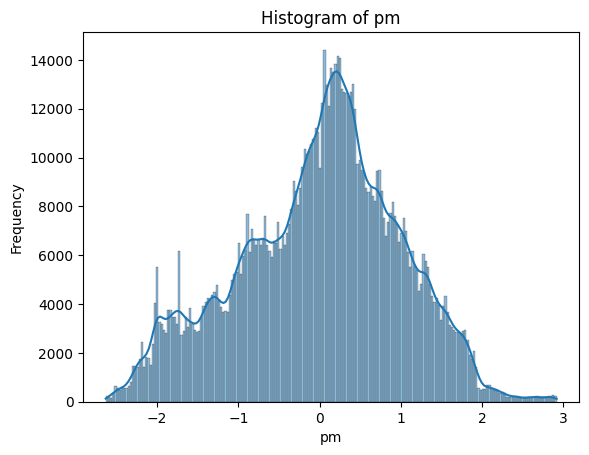

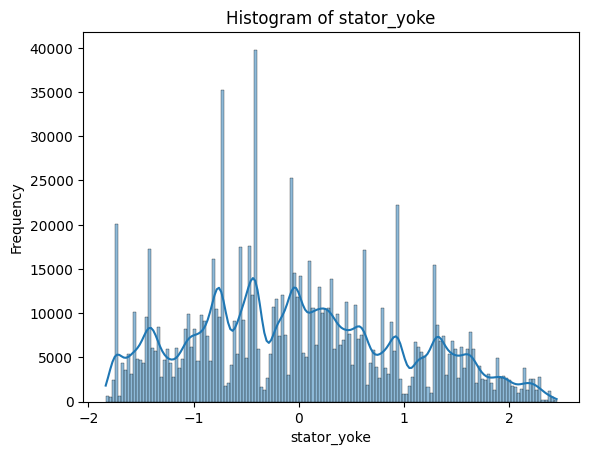

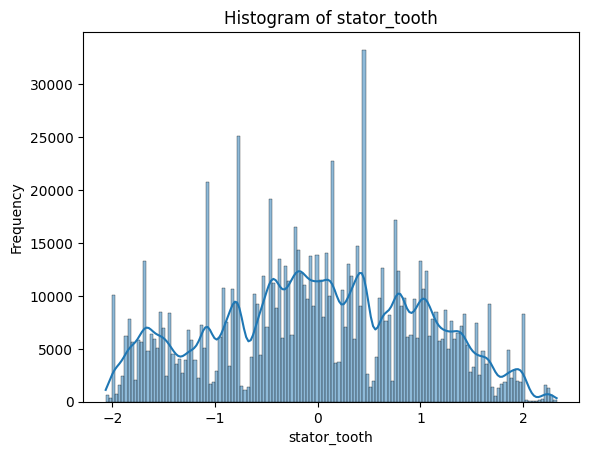

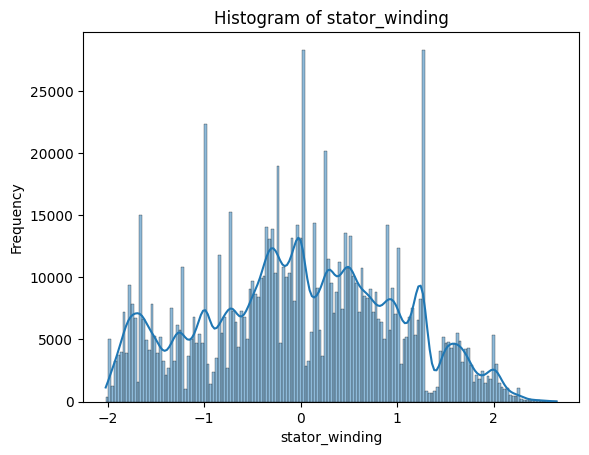

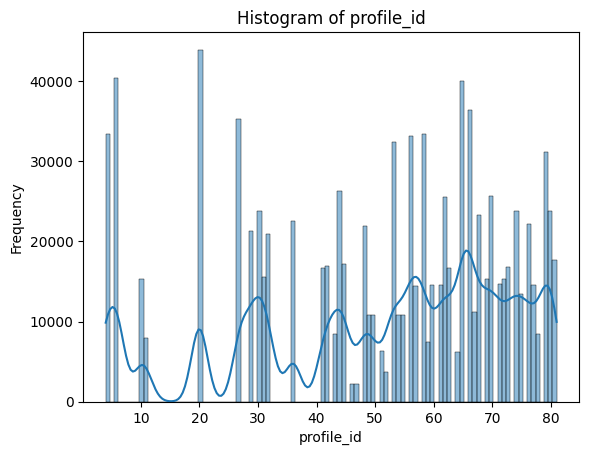

In [4]:
# Get the column names as a list
column_names = data.columns.tolist()

# Iterate over each column for single variable visualization
for column in column_names:
    sns.histplot(data[column], kde=True)  # Plot the current column as a histogram
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.show()
    
  

In the hisplot results most of the variabels are right tiled which means they all have positive skew and few of them are  most likely normally distributed

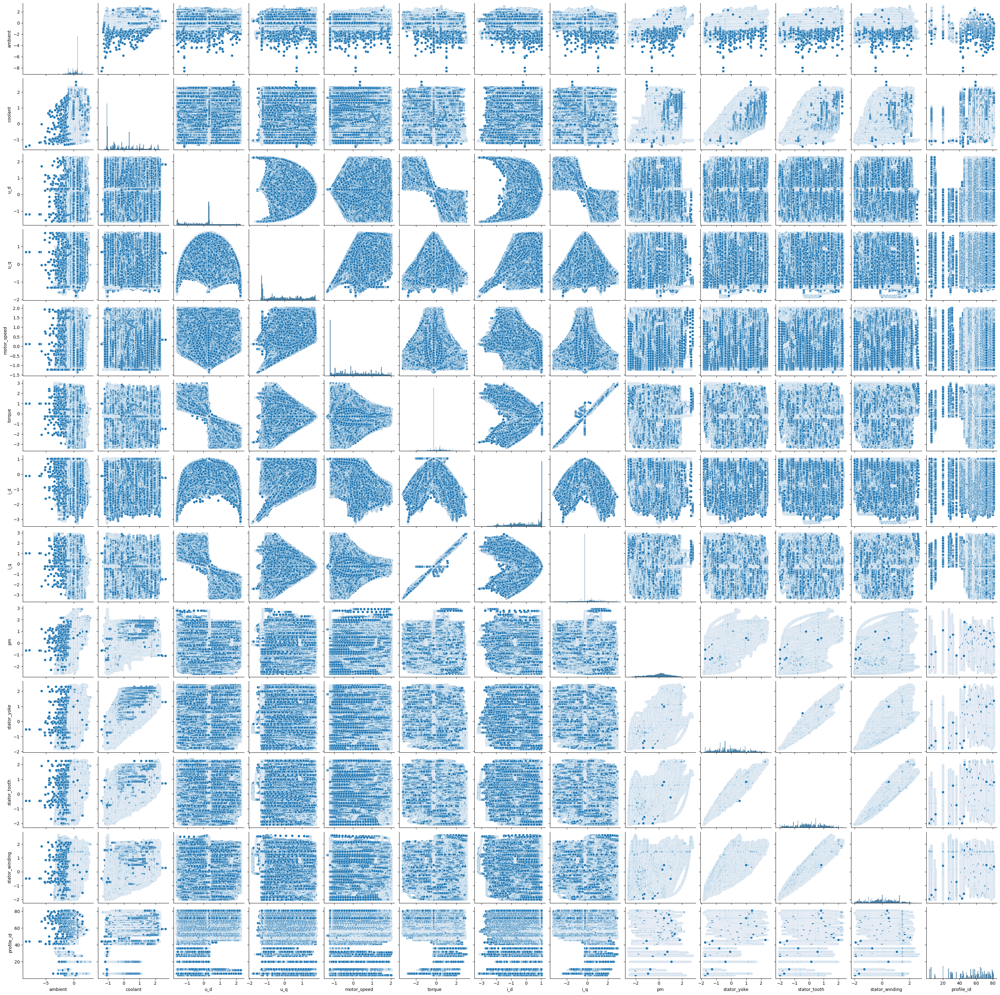

In [14]:
# Multiple Variables Visualization
# Generate basic visualizations to understand the distribution and relationships of the variables:

selected_columns = column_names[:13]  # Select the first 12 columns and the last column
sns.pairplot(data[selected_columns])  # Visualize the all columns
plt.show()

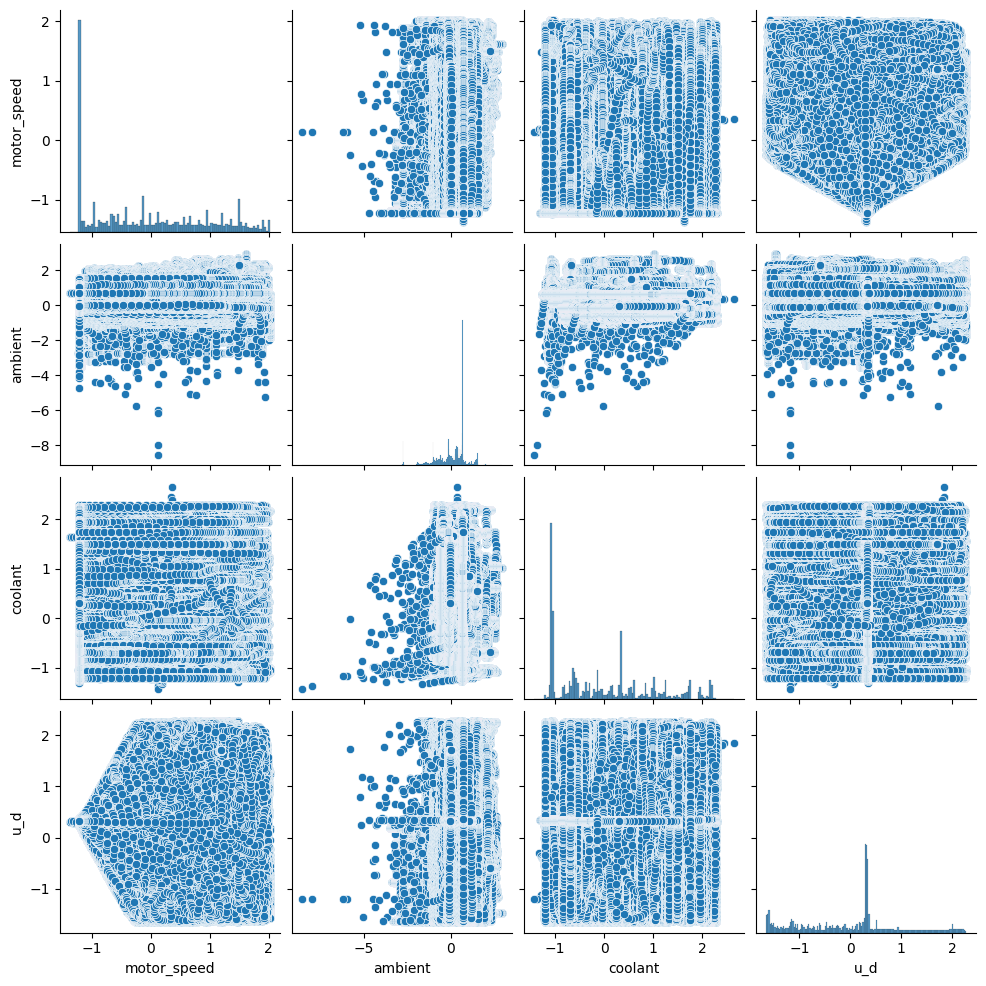

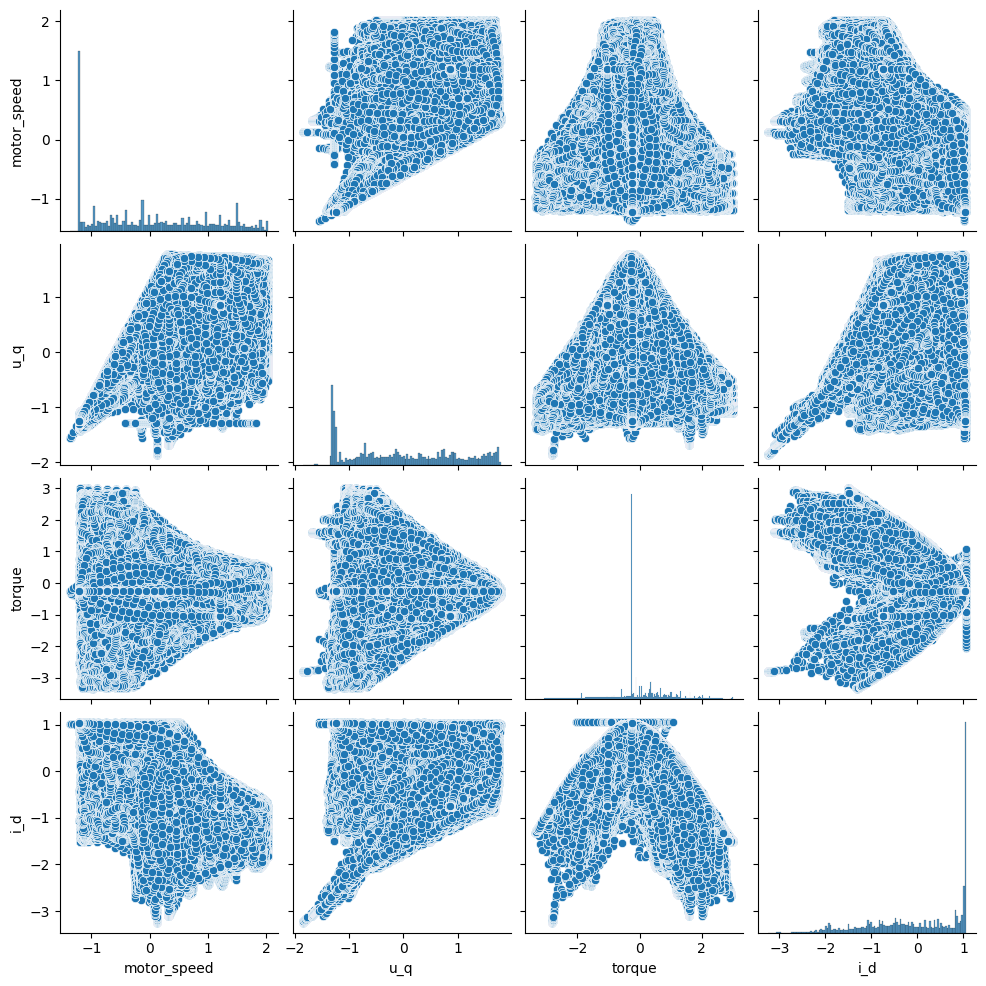

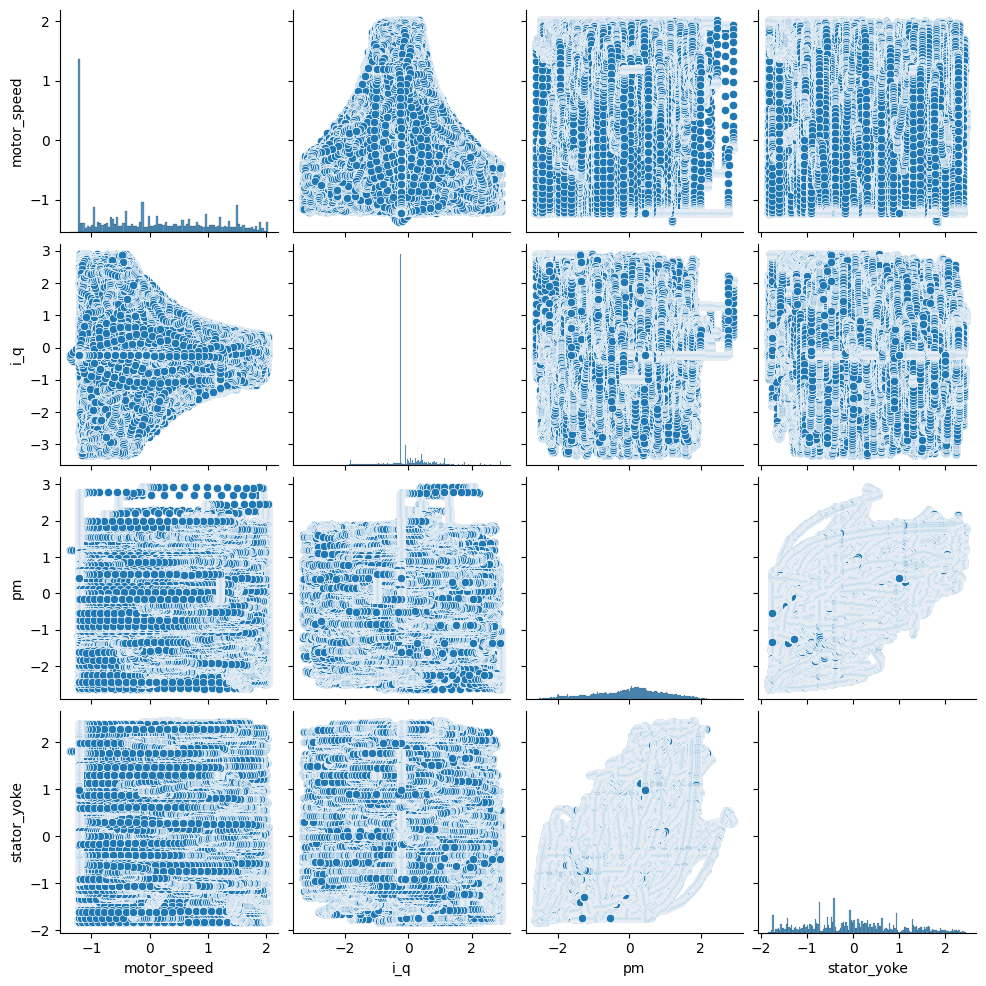

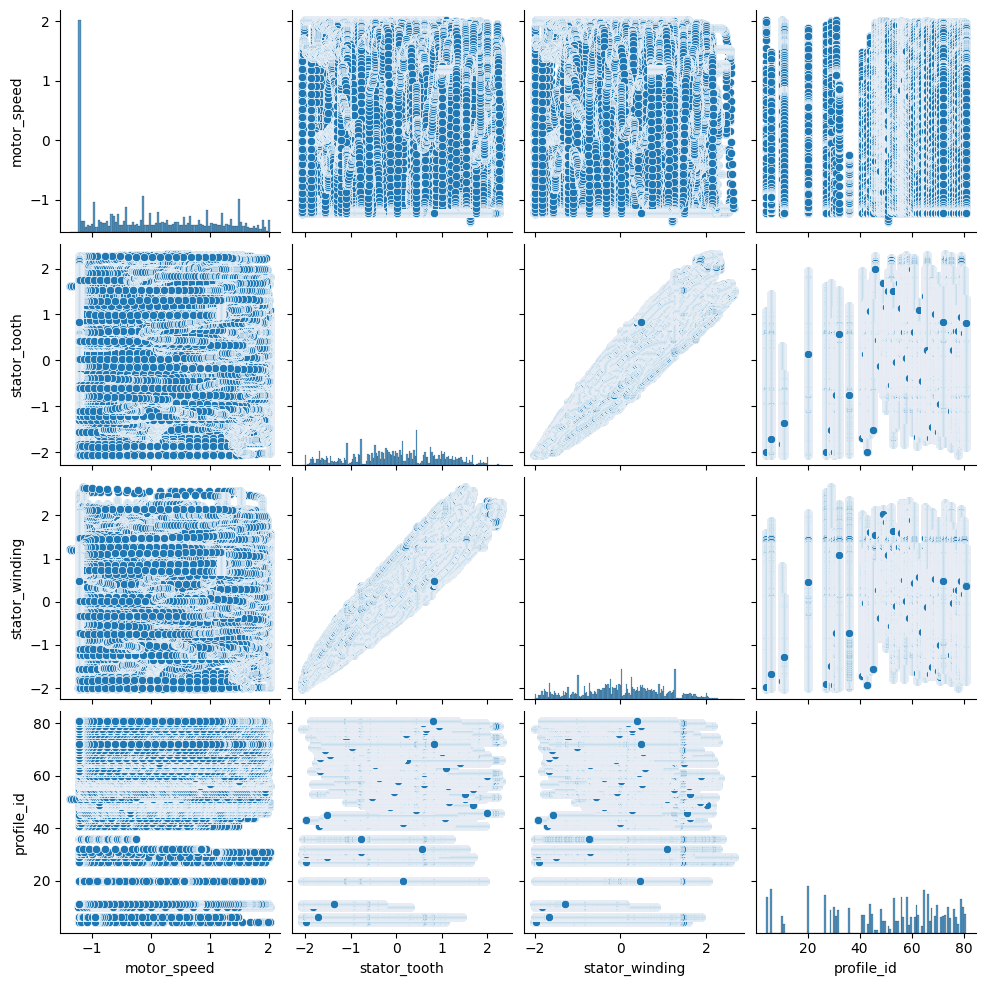

In [32]:

# Selecting the target variable for the scatter plot to fine the relation of the data
target_variable = 'motor_speed' 

# Get the list of column names excluding the target variable
column_names = data.columns.tolist()
column_names.remove(target_variable)

# Group the column names into sets of three
variable_groups = [column_names[i:i+3] for i in range(0, len(column_names), 3)]

# Iterate over each group of variables
for group in variable_groups:
    sns.pairplot(data=data, vars=[target_variable] + group)
    plt.show()

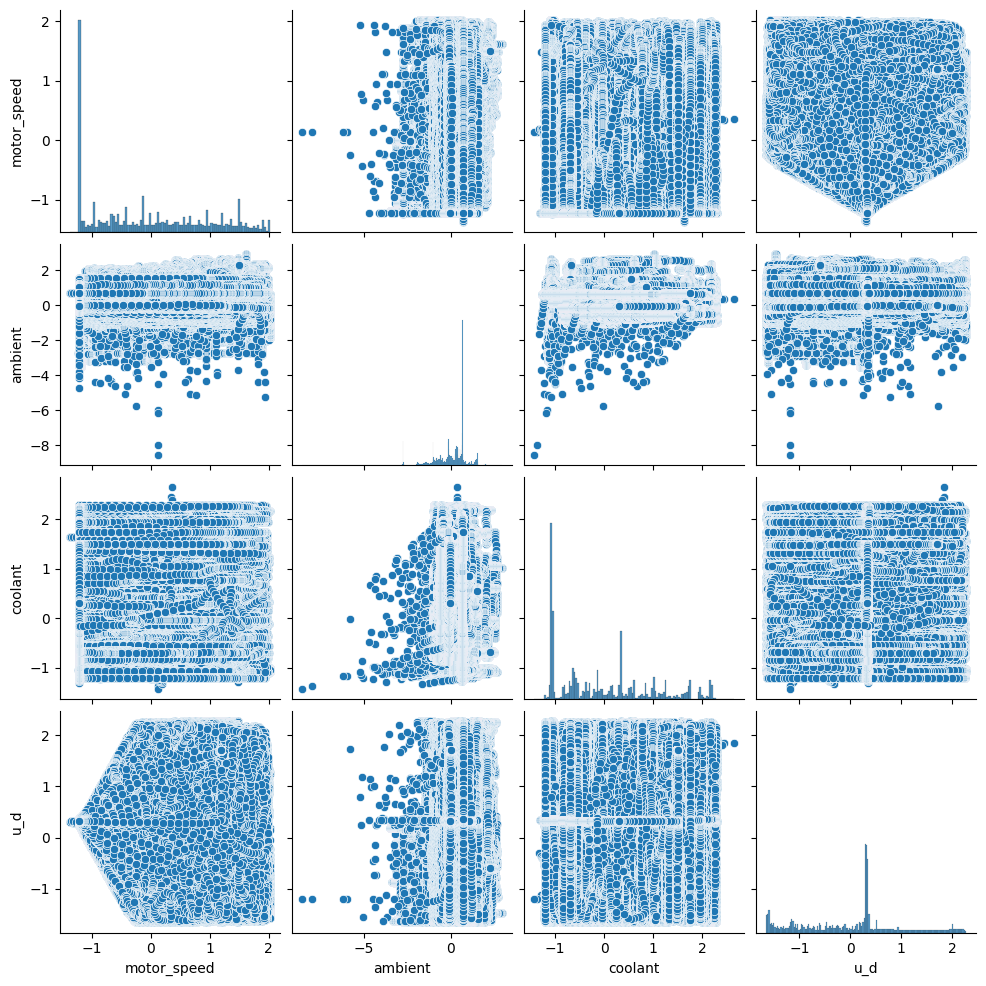

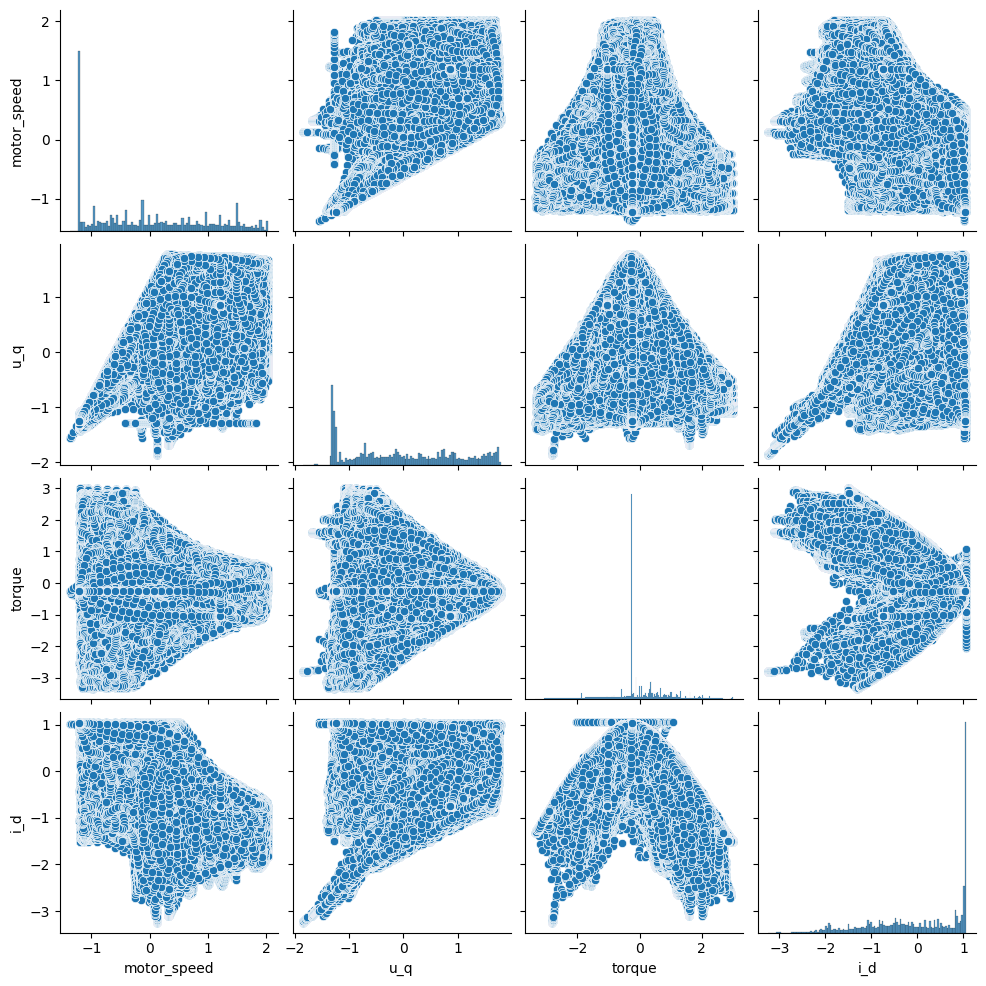

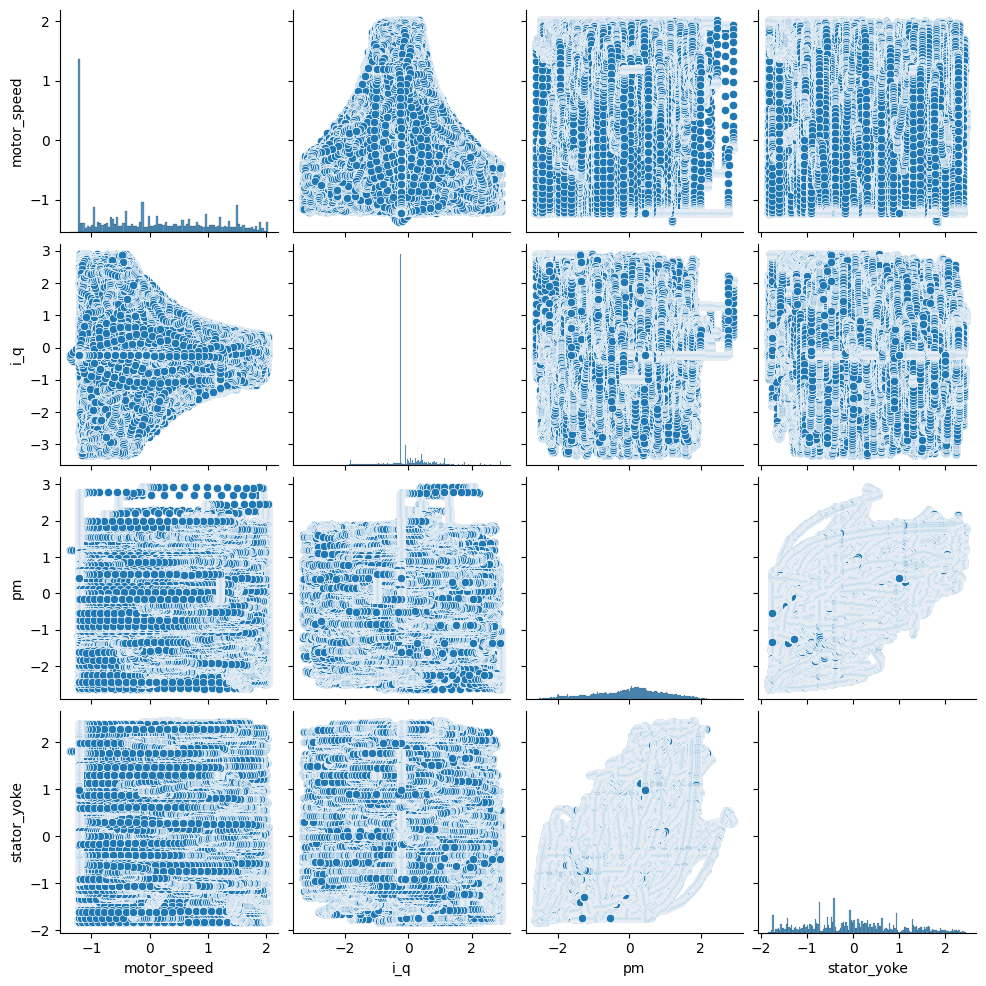

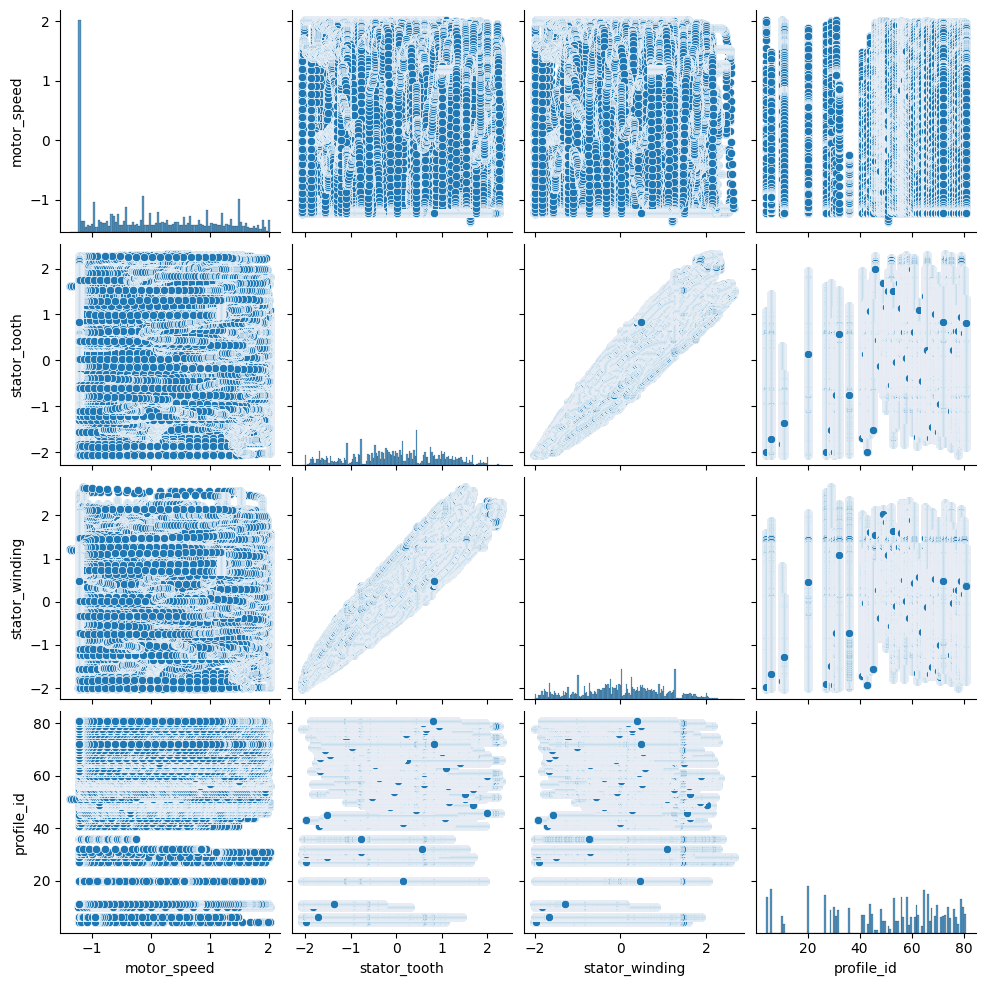

In [34]:
# Select the target variable
target_variable = 'motor_speed'  

# the list of column names excluding the target variable
column_names = data.columns.tolist()
column_names.remove(target_variable)

# Group the column names into sets of three
variable_groups = [column_names[i:i+3] for i in range(0, len(column_names), 3)]

# Iterate over each group of variables
for group in variable_groups:
    sns.pairplot(data=data, vars=[target_variable] + group)
    plt.show()

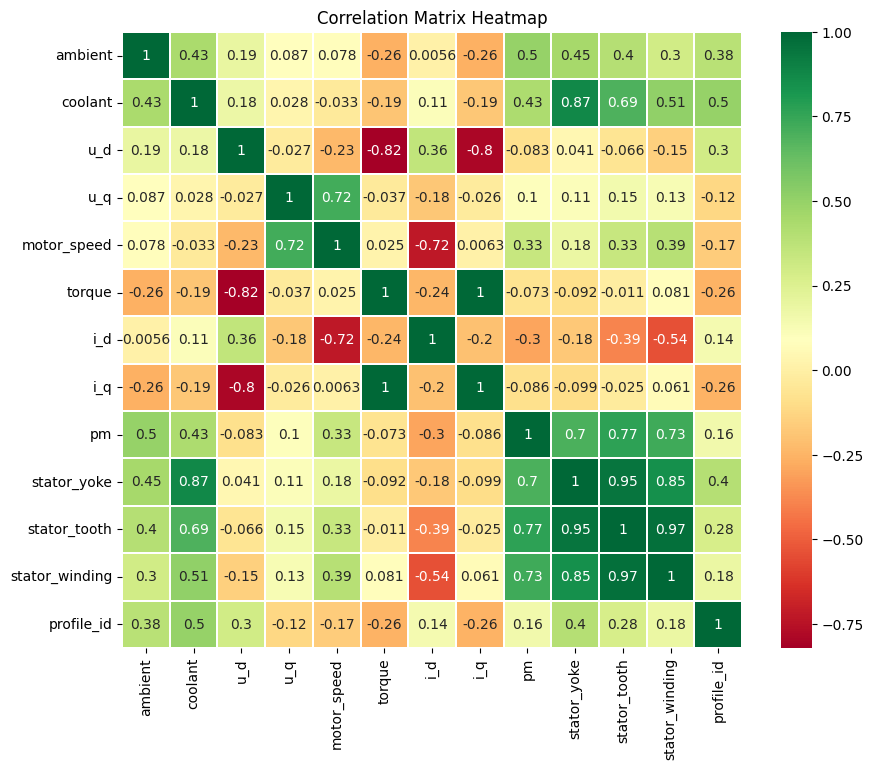

In [4]:
# Calculate the correlation matrix
correlation_matrix = data.corr()

# Set up the figure and plot the correlation matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlGn', linewidths=0.2)

# Add title and axis labels
plt.title('Correlation Matrix Heatmap')
# Display the correlation matrix heatmap
plt.show()

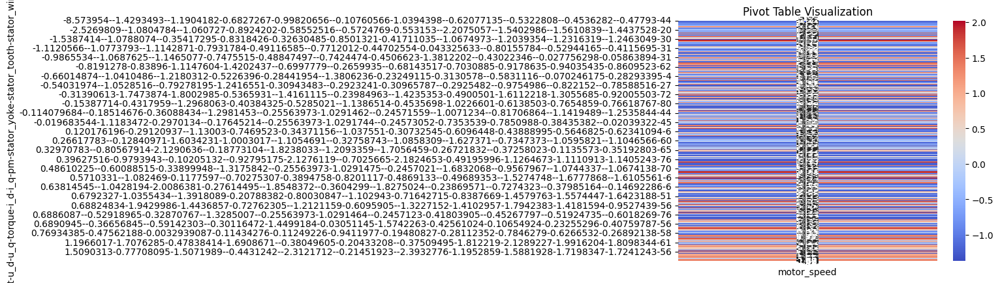

In [5]:

# Define the target variable
target_variable = 'motor_speed'  # Replace with the name of your target variable

# Define the index variables
index_variables = ['ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d', 'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding', 'profile_id']

# Create the pivot table
pivot_table = pd.pivot_table(data, values=target_variable, index=index_variables)

# Plot the pivot table using seaborn heatmap
sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Pivot Table Visualization')
plt.show()


In [ ]:

# Define the target variable
target_variable = 'motor_speed'  # Replace with the name of your target variable

# Define the index variables
index_variables = ['ambient', 'stator_tooth']

# Create the pivot table
pivot_table = pd.pivot_table(data, values=target_variable, index=index_variables)

# Plot the pivot table using seaborn heatmap
sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Pivot Table Visualization')
plt.show()


In [2]:
# importing the visualization and the manuplating packages to do analysis 

import pandas as pd # for malipulating and analysis
import numpy as np # for scintifinc computing

# visuaization packeges

import seaborn as sns # create the visualization 
import matplotlib.pyplot as plt # it is used for the customizing


data = pd.read_csv('temperature_data.csv')
data.head(2)

# loding the data with top two rows

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4


In [2]:
#!pip install dtale

  Using cached dtale-3.2.0-py2.py3-none-any.whl (14.1 MB)
  Using cached dash_daq-0.5.0-py3-none-any.whl
  Using cached Flask_Compress-1.13-py3-none-any.whl (7.9 kB)
  Using cached future-0.18.3-py3-none-any.whl
  Using cached missingno-0.4.2-py3-none-any.whl (9.7 kB)
  Using cached flask_ngrok-0.0.25-py3-none-any.whl (3.1 kB)
  Using cached lz4-4.3.2-cp311-cp311-win_amd64.whl (99 kB)
  Using cached dash_bootstrap_components-1.3.1-py3-none-any.whl (219 kB)
  Using cached matplotlib-3.6.3-cp311-cp311-win_amd64.whl (7.2 MB)
  Using cached openpyxl-3.1.2-py2.py3-none-any.whl (249 kB)
  Using cached xarray-2023.7.0-py3-none-any.whl (1.0 MB)
  Using cached dash-2.11.1-py3-none-any.whl (10.4 MB)
  Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)
  Using cached plotly-5.15.0-py2.py3-none-any.whl (15.5 MB)
  Using cached Flask-2.2.5-py3-none-any.whl (101 kB)
  Using cached retrying-1.3.4-py3-none-any.whl (11 kB)
  Using cached ansi2html-1.8.0-py3-none-any.whl (16 kB)
  Attempting uninst

In [4]:
import pandas as pd

import dtale

In [7]:
dtale.show(data)

In [3]:
import sweetviz as sv

# Assuming your data is loaded into a pandas DataFrame named 'data'
report = sv.analyze(data)

# Display the report in the Jupyter Notebook
report.show_notebook()

# Alternatively, save the report to an HTML file
report.show_html('sweetviz_report.html')


AttributeError: 'DataFrame' object has no attribute 'iteritems'

In [8]:


#!pip install pandas-profiling
import pandas as pd
from pandas_profiling import ProfileReport

# Create a profile report
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)

# Display the report in the Jupyter Notebook
profile.to_notebook_iframe()

# Alternatively, save the report to an HTML file
profile.to_file('pandas_profiling_report.html')


ImportError: cannot import name 'DataError' from 'pandas.core.base' (D:\my_space\Lib\site-packages\pandas\core\base.py)

In [ ]:
!pip uninstall pandas
#!pip install pandas==1.3.3